In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap

sns.set_style("whitegrid")

In [2]:
df = pd.read_csv("C:\\Users\\Rak\\Desktop\\Projects\\Restaurant Insights - Geo Spatial Data Analysis\\Dataset\\cleaned_restaurant_data.csv")
df.head(10)

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Locality_Verbose,Longitude,Latitude,Cuisines,...,Currency,Has_Table_booking,Has_Online_delivery,Is_delivering_now,Switch_to_order_menu,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
5,18189371,Din Tai Fung,162,Mandaluyong City,"Ground Floor, Mega Fashion Hall, SM Megamall, ...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056314,14.583764,Chinese,...,Botswana Pula(P),No,No,No,No,3,4.4,Green,Very Good,336
6,6300781,Buffet 101,162,Pasay City,"Building K, SM By The Bay, Sunset Boulevard, M...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979667,14.531333,"Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.0,Green,Very Good,520
7,6301290,Vikings,162,Pasay City,"Building B, By The Bay, Seaside Boulevard, Mal...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979333,14.540000,"Seafood, Filipino, Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.2,Green,Very Good,677
8,6300010,Spiral - Sofitel Philippine Plaza Manila,162,Pasay City,"Plaza Level, Sofitel Philippine Plaza Manila, ...","Sofitel Philippine Plaza Manila, Pasay City","Sofitel Philippine Plaza Manila, Pasay City, P...",120.980090,14.552990,"European, Asian, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.9,Dark Green,Excellent,621
9,6314987,Locavore,162,Pasig City,"Brixton Technology Center, 10 Brixton Street, ...",Kapitolyo,"Kapitolyo, Pasig City",121.056532,14.572041,Filipino,...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,532


In [3]:
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

In [4]:
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=4,
        color='green' if row['Aggregate_rating'] >= 4 else 'orange',
        fill=True,
        fill_opacity=0.6,
        popup=f"Rating: {row['Aggregate_rating']}"
    ).add_to(restaurant_map)

In [5]:
restaurant_map

In [6]:
heat_data = df[['Latitude', 'Longitude']].dropna().values.tolist()
heat_map = folium.Map(location=map_center, zoom_start=12)
HeatMap(heat_data).add_to(heat_map)

In [7]:
heat_map

In [8]:
restaurant_map.save("C:\\Users\\Rak\\Desktop\\Projects\\Restaurant Insights - Geo Spatial Data Analysis\\Maps\\restaurant_map.html")
heat_map.save("C:\\Users\\Rak\\Desktop\\Projects\\Restaurant Insights - Geo Spatial Data Analysis\\Maps\\restaurant_heatmap.html")

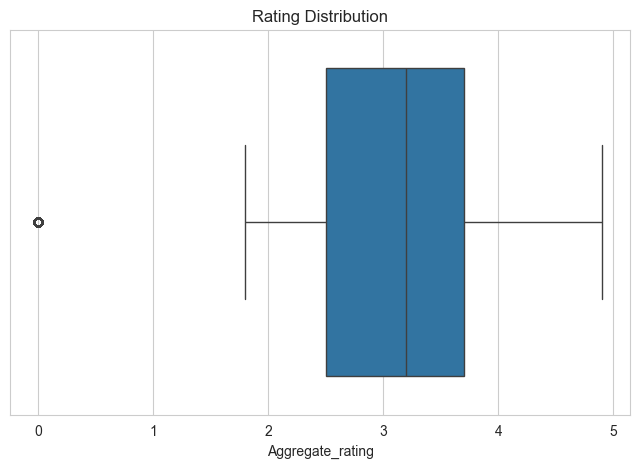

In [9]:
plt.figure(figsize=(8,5))
sns.boxplot(x=df['Aggregate_rating'])
plt.title("Rating Distribution")
plt.show()

In [10]:
top_restaurants = df.sort_values(by=['Aggregate_rating', 'Votes'], ascending=False).head(10)
top_restaurants[['Restaurant_Name', 'City', 'Aggregate_rating', 'Votes']]

,Restaurant_Name,City,Aggregate_rating,Votes
2405,Barbeque Nation,Kolkata,4.9,5966
2298,AB's - Absolute Barbecues,Hyderabad,4.9,5434
2486,Mirchi And Mime,Mumbai,4.9,3244
3004,Naturals Ice Cream,New Delhi,4.9,2620
367,McGuire's Irish Pub & Brewery,Pensacola,4.9,2238
9287,Talaga Sampireun,Tangerang,4.9,2212
3592,Indian Accent - The Manor,New Delhi,4.9,1934
2400,Barbeque Nation,Kolkata,4.9,1753
9270,Talaga Sampireun,Jakarta,4.9,1662
9282,Talaga Sampireun,Jakarta,4.9,1640
